## The case study is aimed at predicting the customers who are likely to churn and taking measures so as to prevent the churn 

In [1]:
## Importing the basic libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from imblearn.over_sampling import SMOTE
import warnings
warnings.filterwarnings('ignore')
import datetime as dt

#### We have used SMOTE for handling data imbalance.

In [3]:
# GridSearchCV to find optimal min_samples_split
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn import metrics
import statsmodels.api as sm
from sklearn.feature_selection import RFE
from sklearn.feature_selection import SelectFromModel



In [4]:
# Check for the VIF values of the feature variables. 
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report, accuracy_score
from sklearn.ensemble import RandomForestClassifier



In [5]:
## Libaries required for boosting
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn import metrics

import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import plot_importance
import gc # for deleting unused variables
%matplotlib inline

### Reading the csv file and storing it in a fataframe

In [6]:
telecom = pd.read_csv('telecom_churn_data.csv')

In [7]:
telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0,NaN,1.0,1.0,NaN,1006,0.0,0.0,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0,NaN,NaN,NaN,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0,0.0,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.00


### Checking the null values in the dataframe

In [8]:
(telecom.isna().sum()/telecom.shape[0])*100

mobile_number            0.000000
circle_id                0.000000
loc_og_t2o_mou           1.018010
std_og_t2o_mou           1.018010
loc_ic_t2o_mou           1.018010
last_date_of_month_6     0.000000
last_date_of_month_7     0.601006
last_date_of_month_8     1.100011
last_date_of_month_9     1.659017
arpu_6                   0.000000
arpu_7                   0.000000
arpu_8                   0.000000
arpu_9                   0.000000
onnet_mou_6              3.937039
onnet_mou_7              3.859039
onnet_mou_8              5.378054
onnet_mou_9              7.745077
offnet_mou_6             3.937039
offnet_mou_7             3.859039
offnet_mou_8             5.378054
offnet_mou_9             7.745077
roam_ic_mou_6            3.937039
roam_ic_mou_7            3.859039
roam_ic_mou_8            5.378054
roam_ic_mou_9            7.745077
roam_og_mou_6            3.937039
roam_og_mou_7            3.859039
roam_og_mou_8            5.378054
roam_og_mou_9            7.745077
loc_og_t2t_mou

In [9]:
df=telecom

### Dropping columns having more than 70% missing values as we cannot impute such huge amount of NANs

In [10]:
df = df.dropna(thresh=len(df.index)*0.7,axis=1)

In [11]:
df.shape

(99999, 186)

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 186 entries, mobile_number to sep_vbc_3g
dtypes: float64(143), int64(35), object(8)
memory usage: 141.9+ MB


In [13]:
df.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,...,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,...,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000
mean,7.001207e+09,109.0,0.0,0.0,0.0,282.987358,278.536648,279.154731,261.645069,132.395875,...,0.086341,0.074781,0.080401,0.084501,0.084581,1219.854749,68.170248,66.839062,60.021204,3.299373
std,6.956694e+05,0.0,0.0,0.0,0.0,328.439770,338.156291,344.474791,341.998630,297.207406,...,0.384978,0.568344,0.628334,0.660234,0.650457,954.733842,267.580450,271.201856,253.938223,32.408353
min,7.000000e+09,109.0,0.0,0.0,0.0,-2258.709000,-2014.045000,-945.808000,-1899.505000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000606e+09,109.0,0.0,0.0,0.0,93.411500,86.980500,84.126000,62.685000,7.380000,...,0.000000,0.000000,0.000000,0.000000,0.000000,467.000000,0.000000,0.000000,0.000000,0.000000
50%,7.001205e+09,109.0,0.0,0.0,0.0,197.704000,191.640000,192.080000,176.849000,34.310000,...,0.000000,0.000000,0.000000,0.000000,0.000000,863.000000,0.000000,0.000000,0.000000,0.000000
75%,7.001812e+09,109.0,0.0,0.0,0.0,371.060000,365.344500,369.370500,353.466500,118.740000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1807.500000,0.000000,0.000000,0.000000,0.000000
max,7.002411e+09,109.0,0.0,0.0,0.0,27731.088000,35145.834000,33543.624000,38805.617000,7376.710000,...,11.000000,29.000000,35.000000,41.000000,49.000000,4337.000000,12916.220000,9165.600000,11166.210000,2618.570000


## Removing variables having only a single value in the entire column as it gives no information to learn

In [14]:
df = df.drop(['circle_id','loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou','last_date_of_month_6','last_date_of_month_7','last_date_of_month_8','last_date_of_month_9','std_og_t2c_mou_6','std_og_t2c_mou_7','std_og_t2c_mou_8','std_og_t2c_mou_9','std_ic_t2o_mou_6','std_ic_t2o_mou_7','std_ic_t2o_mou_8','std_ic_t2o_mou_9'],axis = 1)

In [15]:
df.head(5)

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,...,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,...,0,0,0,0,0,968,30.4,0.0,101.20,3.58
1,7001865778,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,...,0,0,0,0,0,1006,0.0,0.0,0.00,0.00
2,7001625959,167.690,189.058,210.226,290.714,11.54,55.24,37.26,74.81,143.33,...,0,0,0,0,0,1103,0.0,0.0,4.17,0.00
3,7001204172,221.338,251.102,508.054,389.500,99.91,54.39,310.98,241.71,123.31,...,0,0,0,0,0,2491,0.0,0.0,0.00,0.00
4,7000142493,261.636,309.876,238.174,163.426,50.31,149.44,83.89,58.78,76.96,...,0,0,0,0,0,1526,0.0,0.0,0.00,0.00


## Filtering out high value customers only based on the previous months data

In [16]:
df['avg_rech'] = (df['total_rech_amt_6'] + df['total_rech_amt_7'])/2

In [17]:
rech_cut_off = df['avg_rech'].quantile(0.70)
rech_cut_off

368.5

In [18]:
df = df[(df['avg_rech']>=368.5)]

In [19]:
df.shape

(30011, 171)

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30011 entries, 7 to 99997
Columns: 171 entries, mobile_number to avg_rech
dtypes: float64(133), int64(34), object(4)
memory usage: 39.4+ MB


In [21]:
df2 = df
df2.shape

(30011, 171)

In [22]:
cols_na = df2.columns[df2.isnull().any()]
cols_na = list(cols_na)
print(cols_na)

['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'onnet_mou_9', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'offnet_mou_9', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_ic_mou_9', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'roam_og_mou_9', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_t2c_mou_9', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'loc_og_mou_9', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2t_mou_9', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2m_mou_9', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_t2f_mou_9', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'std_og_mou_9', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'is

### We have 110+ columns with missing values

In [23]:
for c in cols_na:
    print("---- %s ---" % c)
    print(df2[c].value_counts())

---- onnet_mou_6 ---
0.00       642
3.68        10
0.26        10
35.24        9
0.18         9
0.78         9
5.01         8
8.14         8
0.31         8
36.28        8
1.66         8
17.49        8
0.46         8
3.49         8
0.35         8
6.78         8
11.51        8
9.18         8
1.98         8
32.46        8
8.81         8
7.43         8
8.66         8
0.86         8
43.23        7
1.61         7
82.61        7
70.31        7
2.56         7
91.14        7
          ... 
237.21       1
76.48        1
267.06       1
23.73        1
278.11       1
193.79       1
5.98         1
271.98       1
950.64       1
803.69       1
300.71       1
954.68       1
384.08       1
405.89       1
1671.08      1
174.33       1
639.59       1
102.94       1
8.85         1
745.56       1
205.79       1
926.51       1
133.11       1
412.24       1
219.36       1
285.13       1
191.46       1
166.43       1
1005.26      1
203.78       1
Name: onnet_mou_6, Length: 18813, dtype: int64
---- onnet_mou_7 

Name: roam_ic_mou_6, Length: 4338, dtype: int64
---- roam_ic_mou_7 ---
0.00      23970
1.01         14
0.51         13
1.21         12
1.28         12
1.61         11
0.56         10
1.58          9
0.35          9
1.73          9
0.60          9
1.48          8
2.78          8
3.93          8
0.45          8
3.01          8
0.61          8
3.58          8
1.03          8
0.43          8
0.05          8
2.73          8
3.78          8
2.88          8
2.16          7
4.33          7
8.19          7
1.26          7
2.01          7
9.81          7
          ...  
53.88         1
33.53         1
199.54        1
189.86        1
59.66         1
37.71         1
53.54         1
22.91         1
56.69         1
305.29        1
242.43        1
16.61         1
170.34        1
43.18         1
253.44        1
81.04         1
741.74        1
208.61        1
38.01         1
10.48         1
142.01        1
159.29        1
571.53        1
32.88         1
372.69        1
140.21        1
37.23         1
1

0.00      21907
0.08         60
0.06         59
0.10         57
0.03         56
0.01         56
0.13         49
0.11         45
0.21         44
0.05         42
0.36         41
0.38         41
0.73         40
0.33         40
0.28         39
0.23         39
0.56         39
0.88         38
0.25         38
0.16         38
0.20         38
0.18         37
0.15         35
0.26         35
0.58         35
0.30         35
0.35         34
0.61         33
1.00         33
2.26         32
          ...  
8.65          1
12.29         1
37.20         1
5.44          1
26.36         1
361.34        1
23.63         1
14.39         1
18.95         1
8.49          1
42.56         1
9.45          1
19.23         1
25.36         1
26.71         1
11.84         1
66.73         1
33.59         1
9.21          1
65.79         1
113.71        1
18.64         1
89.36         1
36.31         1
13.76         1
12.63         1
10.11         1
25.59         1
68.03         1
11.61         1
Name: loc_og_t2c_mou_7, 

---- std_og_mou_8 ---
0.00       5103
0.45         27
0.35         25
0.88         23
0.30         22
0.68         22
0.83         22
0.48         21
0.33         21
0.43         21
1.11         21
1.21         20
0.36         20
1.03         19
0.20         19
0.31         18
0.65         18
0.38         18
0.96         18
1.66         18
1.01         18
1.28         17
0.66         17
0.63         17
0.53         17
0.78         17
0.40         17
0.51         17
0.50         17
1.63         16
           ... 
901.09        1
310.06        1
18.64         1
147.66        1
87.38         1
1840.63       1
1518.76       1
992.89        1
85.29         1
47.89         1
49.61         1
215.61        1
1141.09       1
73.81         1
462.23        1
718.93        1
437.76        1
474.13        1
688.94        1
473.01        1
34.49         1
441.86        1
1095.08       1
28.34         1
597.63        1
169.56        1
262.34        1
179.83        1
833.74        1
1154.64       1
Na

0.00      782
18.83      11
39.39      10
0.48       10
24.78       9
27.01       9
18.23       9
1.28        8
14.31       8
63.98       8
57.49       8
18.88       8
17.26       8
17.99       8
27.93       8
0.45        8
60.63       8
20.09       8
14.03       8
14.06       8
25.73       8
58.03       8
6.83        8
54.68       8
1.21        8
18.19       8
99.83       8
8.39        7
49.79       7
1.61        7
         ... 
227.14      1
57.98       1
8.06        1
83.91       1
25.76       1
739.78      1
156.33      1
210.01      1
560.84      1
310.88      1
154.69      1
207.98      1
269.76      1
213.16      1
639.83      1
128.86      1
346.36      1
246.18      1
237.28      1
269.73      1
76.11       1
2.88        1
58.26       1
75.09       1
186.41      1
30.08       1
233.58      1
172.79      1
99.06       1
414.38      1
Name: loc_ic_t2m_mou_7, Length: 16068, dtype: int64
---- loc_ic_t2m_mou_8 ---
0.00       1348
0.78         11
0.66         11
41.13        10
23.0

0.00       6688
0.03         68
0.01         67
0.23         55
0.26         52
0.30         52
0.21         52
0.48         52
0.36         50
0.46         47
0.71         46
0.31         46
0.41         45
0.28         45
0.53         44
0.81         44
0.43         43
0.33         43
0.38         42
0.66         42
1.01         42
0.40         41
0.76         41
0.51         41
0.18         40
0.98         40
0.25         40
0.83         39
0.63         38
0.73         37
           ... 
176.14        1
78.36         1
90.01         1
241.88        1
71.09         1
201.28        1
785.24        1
44.98         1
214.18        1
55.71         1
78.71         1
89.06         1
72.11         1
254.16        1
146.64        1
72.98         1
51.28         1
1046.99       1
4.95          1
169.48        1
105.03        1
38.24         1
72.56         1
75.94         1
20.44         1
106.06        1
144.08        1
218.46        1
236.43        1
61.61         1
Name: std_ic_t2m_mou_8, 

0.00     22225
0.10       134
0.06       125
0.05       122
0.11       120
0.13       113
0.16       108
0.46       106
0.20       106
0.08        99
0.21        94
0.28        86
0.38        83
0.48        82
0.18        80
0.26        76
0.15        73
0.41        72
0.33        71
0.35        68
0.43        67
0.23        66
0.30        66
0.25        64
0.03        63
0.36        60
0.40        59
0.51        58
0.45        57
0.31        56
         ...  
19.91        1
4.30         1
26.86        1
17.79        1
37.46        1
21.24        1
19.94        1
9.29         1
28.98        1
11.19        1
19.50        1
56.75        1
7.74         1
3.89         1
31.53        1
5.85         1
46.94        1
20.98        1
10.93        1
4.14         1
15.11        1
16.78        1
25.96        1
6.74         1
26.79        1
19.76        1
12.28        1
26.94        1
32.98        1
8.46         1
Name: ic_others_7, Length: 1371, dtype: int64
---- ic_others_8 ---
0.00      21359
0.

## Imputing NA with 0 as most of the columns have many zeros in them

In [24]:
df2 = df2.fillna(0)

## Derived metrics

## Deriving number of days sine last recharge for a customer based on last recharge dates from each month's data

In [25]:
September = '9/01/2014'

In [26]:
df2['September'] = September

### Converting the dates(in the data) in valid date format so as to handle them correctly

In [27]:
df2['date_of_last_rech_6'] =  pd.to_datetime(df2['date_of_last_rech_6'])
df2['September'] = pd.to_datetime(df2['September'])

In [28]:
df2['date_of_last_rech_7'] = pd.to_datetime(df2['date_of_last_rech_7'])
df2['date_of_last_rech_8'] = pd.to_datetime(df2['date_of_last_rech_8'])

In [29]:
df2['days_since_last_recharge'] = (df2['September'] - df2['date_of_last_rech_8']).dt.days

In [30]:
df2['days_since_last_recharge'] =df2['days_since_last_recharge'].replace(16314.000000, 1)

In [31]:
df2['days_since_last_recharge'].describe()

count    30011.000000
mean         5.009530
std          5.070359
min          1.000000
25%          2.000000
50%          3.000000
75%          7.000000
max         31.000000
Name: days_since_last_recharge, dtype: float64

## As can be seen all the customers have rechardged in the month of August (08/14) we can drop the columns for august, june ,july and september 

In [32]:
df2 = df2.drop(['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','September'],axis = 1)

In [33]:
df2.shape

(30011, 169)

In [34]:
df3 = df2

## Defining condition for churn

In [35]:
df2['churn'] = np.where((((df2['total_ic_mou_9'] == 0.0) & (df2['total_og_mou_9'] == 0.0)) 
                         & ((df2['vol_2g_mb_9'] == 0.0) & (df2['vol_3g_mb_9'] == 0.0))),1,0)

In [36]:
df2['churn'].value_counts()

0    27418
1     2593
Name: churn, dtype: int64

## Dropping 9th month's data

In [37]:
df2 = df2.drop([col for col in df2.columns if '_9' in col], axis=1)

In [38]:
df2.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,...,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech,days_since_last_recharge,churn
7,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,...,0,0,802,57.74,19.38,18.74,0.0,1185.0,6,1
8,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,...,0,0,315,21.03,910.65,122.16,0.0,519.0,2,0
13,7002191713,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,...,0,0,2607,0.00,0.00,0.00,0.0,380.0,2,0
16,7000875565,430.975,299.869,187.894,50.51,74.01,70.61,296.29,229.74,162.76,...,0,0,511,0.00,2.45,21.89,0.0,459.0,18,0
17,7000187447,690.008,18.980,25.499,1185.91,9.28,7.79,61.64,0.00,5.54,...,0,0,667,0.00,0.00,0.00,0.0,408.0,7,0


## Deriving change in average revenue from one month to other as it could be a good measure to indicate customer behavior

In [39]:
df2['arup_7_6'] = df2['arpu_7'] - df2['arpu_6']

In [40]:
df2['arup_7_6'].describe()

count    30011.000000
mean         1.851024
std        389.115574
min     -11505.508000
25%       -151.816000
50%          0.006000
75%        151.864000
max      13197.879000
Name: arup_7_6, dtype: float64

In [41]:
df2['churn'].corr(df2['arup_7_6'])

-0.10278803080123837

In [42]:
df2['arpu_8_7'] = df2['arpu_8'] - df2['arpu_7']

In [43]:
df2['churn'].corr(df2['arpu_8_7'])

-0.22571588134145087

In [44]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30011 entries, 7 to 99997
Columns: 131 entries, mobile_number to arpu_8_7
dtypes: float64(103), int32(1), int64(27)
memory usage: 30.1 MB


## Plotting Churn varaible against the new derived metrics

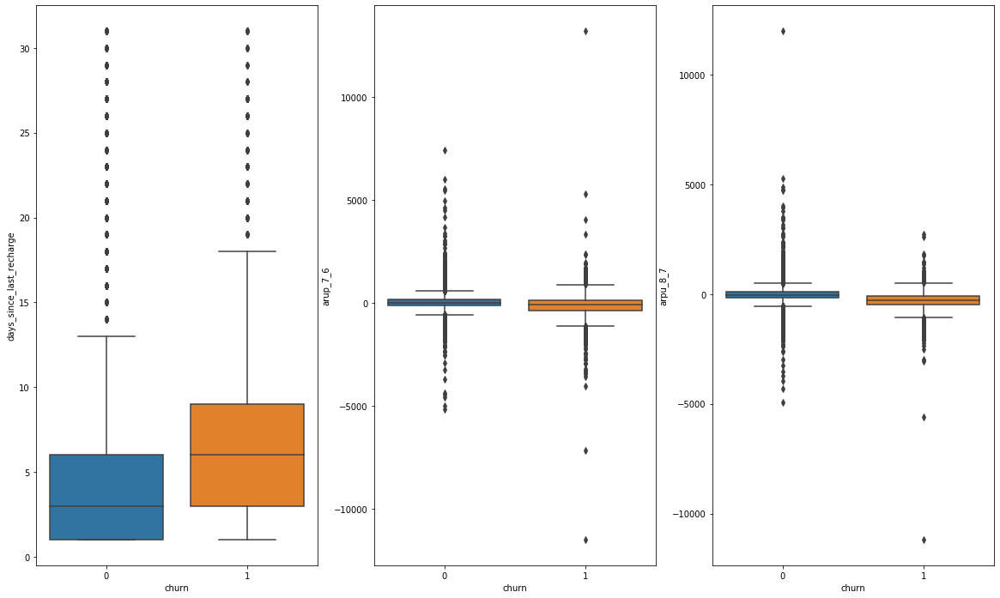

In [45]:
plt.figure(figsize=(20, 12))
plt.subplot(1,3,1)
sns.boxplot(x = 'churn', y = 'days_since_last_recharge', data = df2)
plt.subplot(1,3,2)
sns.boxplot(x = 'churn', y = 'arup_7_6', data = df2)
plt.subplot(1,3,3)
sns.boxplot(x = 'churn', y = 'arpu_8_7', data = df2)

## Plotting a correlation heatmap to understand overall correlation of variables with one another

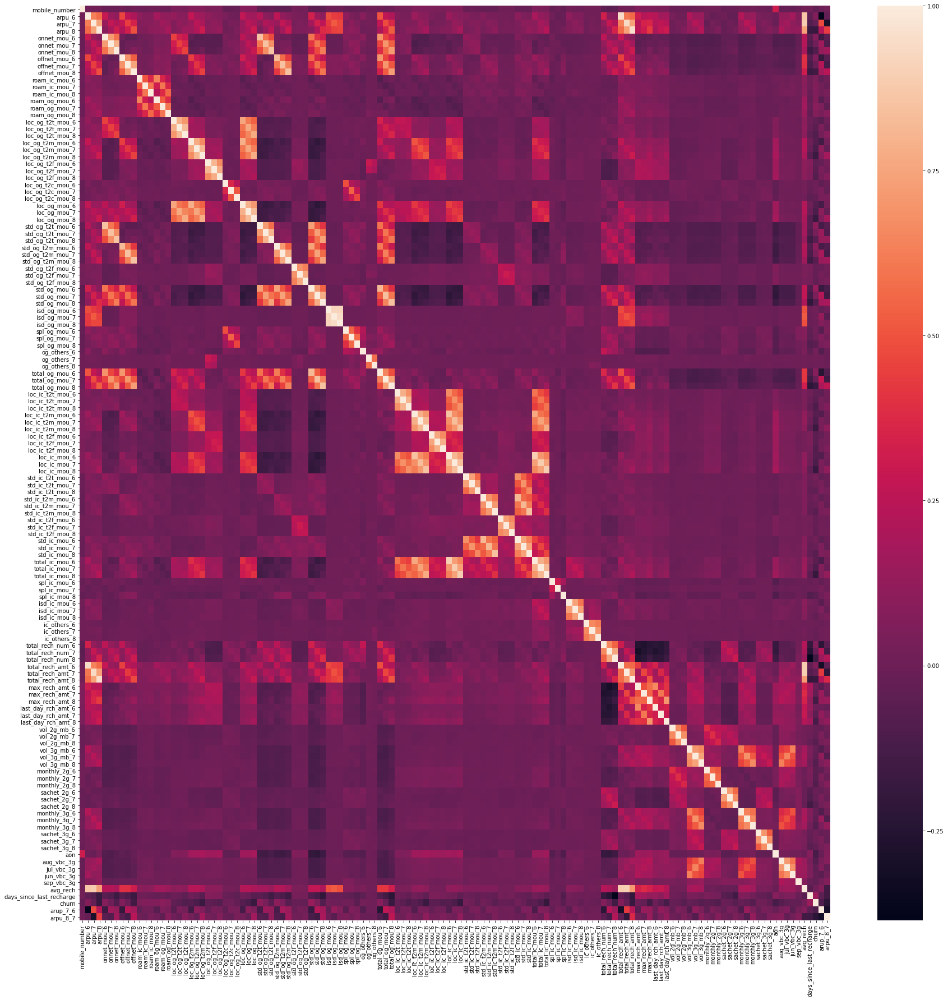

In [46]:
plt.figure(figsize = (30,30))
sns.heatmap(df2.corr())
plt.show()

# Train test split

In [47]:
df_train , df_test = train_test_split(df2, train_size = 0.70, test_size = 0.30, random_state = 100)

In [48]:
y_train = df_train['churn']
y_test = df_test['churn']

df_train = df_train.drop(['churn'],axis = 1)
df_test = df_test.drop(['churn'],axis = 1)

X_train = df_train
X_test = df_test

In [49]:
X_train_df = X_train
X_test_df = X_test


In [50]:
X_train_df_or = X_train_df
X_test_df_or = X_test_df

In [51]:
y_train_df = y_train
y_test_df = y_test

In [52]:
X_train_columns = X_train.columns

In [53]:
X_train_df_mobile = X_train_df['mobile_number']
X_train_df = X_train_df.drop(['mobile_number'],axis = 1)

## For handling data imbalance we use SMOTE for logisitc regression, PCA and XGBoost

In [54]:
smt = SMOTE()
X_train,y_train = smt.fit_sample(X_train,y_train)
np.bincount(y_train)
X_train = pd.DataFrame(X_train, columns= X_train_columns)

In [55]:
X_train_dt = X_train
y_test_dt = y_test
X_test_dt = X_test

In [56]:
X_test_df_mob = X_test_df['mobile_number']
X_test_df = X_test_df.drop(['mobile_number'],axis = 1)


In [57]:
mob_train = X_train['mobile_number']

In [58]:
X_train = X_train.drop(['mobile_number'],axis = 1)
X_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech,days_since_last_recharge,arup_7_6,arpu_8_7
0,331.304,480.315,386.671,336.33,564.78,424.11,154.94,71.08,88.14,0.0,...,0.0,353.0,0.00,0.00,0.00,0.00,461.5,1.0,149.011,-93.644
1,320.013,508.681,480.398,110.08,27.54,131.03,220.86,117.84,168.99,0.0,...,0.0,1076.0,170.16,67.21,48.78,12.56,464.0,12.0,188.668,-28.283
2,289.191,802.774,562.645,26.19,83.34,84.73,206.61,538.99,411.43,0.0,...,0.0,2282.0,0.00,0.00,0.00,0.00,615.5,2.0,513.583,-240.129
3,491.912,570.752,544.894,177.03,419.24,108.21,641.28,609.36,815.64,0.0,...,0.0,2613.0,0.00,0.00,0.00,0.00,630.0,2.0,78.840,-25.858
4,631.214,596.405,277.594,118.18,239.38,63.86,475.76,287.48,174.93,0.0,...,0.0,439.0,0.00,0.00,0.00,0.00,700.0,1.0,-34.809,-318.811


In [59]:
X_train_Columns = X_train.columns


In [60]:
X_test_columns = X_test.columns

In [61]:
X_test_mobile_number = X_test['mobile_number']
X_test = X_test.drop(['mobile_number'],axis = 1)

In [62]:
y_train.shape

(38368,)

In [63]:
X_train.shape

(38368, 129)

# Feature scaling using standard scaler

In [64]:
scaler = StandardScaler()
cols = X_train.columns
X_train[cols] = scaler.fit_transform(X_train[cols])

In [65]:
X_test[cols] = scaler.fit_transform(X_test[cols])

In [66]:
X_train.describe()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech,days_since_last_recharge,arup_7_6,arpu_8_7
count,3.836800e+04,3.836800e+04,3.836800e+04,3.836800e+04,3.836800e+04,3.836800e+04,3.836800e+04,3.836800e+04,3.836800e+04,3.836800e+04,...,3.836800e+04,3.836800e+04,3.836800e+04,3.836800e+04,3.836800e+04,3.836800e+04,3.836800e+04,3.836800e+04,3.836800e+04,3.836800e+04
mean,7.620610e-15,4.276672e-15,-1.863658e-14,1.447640e-15,-2.660863e-15,3.729696e-15,-1.264388e-14,-1.734024e-14,-1.403647e-14,-5.355333e-16,...,-2.121904e-14,5.490401e-15,2.407744e-15,-2.108497e-14,-2.670978e-14,1.687045e-14,8.884718e-15,-8.534258e-15,-5.812438e-16,1.997510e-15
std,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,...,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00,1.000013e+00
min,-7.420443e+00,-6.204841e+00,-3.145885e+00,-7.283664e-01,-6.677538e-01,-4.858397e-01,-9.489590e-01,-8.700489e-01,-6.558575e-01,-2.446435e-01,...,-1.178287e-01,-1.049974e+00,-2.694525e-01,-3.000839e-01,-3.001624e-01,-1.025030e-01,-7.925612e-01,-9.611958e-01,-1.132533e+01,-2.986353e+01
25%,-5.717014e-01,-5.072885e-01,-6.658798e-01,-6.063377e-01,-5.626842e-01,-4.627367e-01,-6.210491e-01,-6.013177e-01,-5.834751e-01,-2.446435e-01,...,-1.178287e-01,-7.298010e-01,-2.694525e-01,-3.000839e-01,-3.001624e-01,-1.025030e-01,-5.567267e-01,-7.737539e-01,-3.934354e-01,-4.428598e-01
50%,-1.997947e-01,-1.870188e-01,-1.774735e-01,-3.674589e-01,-3.502523e-01,-3.457116e-01,-2.927228e-01,-2.931186e-01,-3.084969e-01,-2.446435e-01,...,-1.178287e-01,-3.728368e-01,-2.694525e-01,-3.000839e-01,-3.001624e-01,-1.025030e-01,-2.707102e-01,-2.114282e-01,5.169148e-02,6.513447e-02
75%,3.305095e-01,2.725748e-01,3.527726e-01,2.294552e-01,1.605010e-01,5.415209e-03,2.685776e-01,2.435143e-01,1.894926e-01,-2.068531e-01,...,-1.178287e-01,4.148589e-01,-2.694525e-01,-2.919413e-01,-2.830301e-01,-1.025030e-01,2.331318e-01,3.249099e-01,4.237287e-01,4.663520e-01
max,3.852659e+01,3.931143e+01,4.441127e+01,1.542398e+01,1.792374e+01,2.659203e+01,1.694598e+01,2.005876e+01,3.413869e+01,2.986448e+01,...,5.033750e+01,3.734124e+00,4.161751e+01,2.560639e+01,3.428637e+01,7.107361e+01,4.508037e+01,4.662062e+00,3.030197e+01,3.292497e+01


# Performing PCA on the Dataset

In [67]:
pca = PCA(svd_solver='randomized',random_state=42)

In [68]:
pca.fit(X_train)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
    svd_solver='randomized', tol=0.0, whiten=False)

In [69]:
pca.components_

array([[ 9.32805165e-02,  1.47618680e-01,  1.82078392e-01, ...,
        -3.71130879e-02,  5.72914793e-02,  4.44128315e-02],
       [ 9.93825184e-02,  1.29813791e-01,  9.36461021e-02, ...,
        -4.49025766e-02,  3.50555183e-02, -3.74930258e-02],
       [ 9.60771676e-02,  1.61687029e-01,  1.50871204e-01, ...,
         1.34819508e-02,  6.81328409e-02, -7.27648887e-03],
       ...,
       [-1.48614135e-01, -4.59450118e-01,  6.36367021e-01, ...,
         7.60025723e-17, -1.68271296e-01, -5.52586908e-01],
       [ 5.55135644e-01, -5.37181677e-01, -5.92046110e-02, ...,
        -2.68882139e-17,  6.28563322e-01,  5.14101011e-02],
       [-0.00000000e+00,  1.02849734e-01, -1.05792340e-01, ...,
         1.61979805e-16,  4.16333634e-16,  9.18643806e-02]])

In [70]:
colnames = list(X_train.columns)
pcs_df = pd.DataFrame({'PC1':pca.components_[0],'PC2':pca.components_[1],'PC3':pca.components_[3],'PC4':pca.components_[4], 'Feature':colnames})
pcs_df

,PC1,PC2,PC3,PC4,Feature
0,0.093281,0.099383,-0.040479,0.245930,arpu_6
1,0.147619,0.129814,-0.019800,0.051563,arpu_7
2,0.182078,0.093646,-0.029942,-0.068734,arpu_8
3,0.013553,0.157625,-0.072966,0.034119,onnet_mou_6
4,0.051509,0.190593,-0.074873,-0.095912,onnet_mou_7
5,0.087053,0.166550,-0.073680,-0.162831,onnet_mou_8
6,0.060908,0.130930,-0.003702,0.230353,offnet_mou_6
7,0.100173,0.162549,0.016774,0.089517,offnet_mou_7
8,0.142069,0.123827,-0.000390,-0.039887,offnet_mou_8
9,-0.000639,0.002275,0.039335,0.072585,roam_ic_mou_6


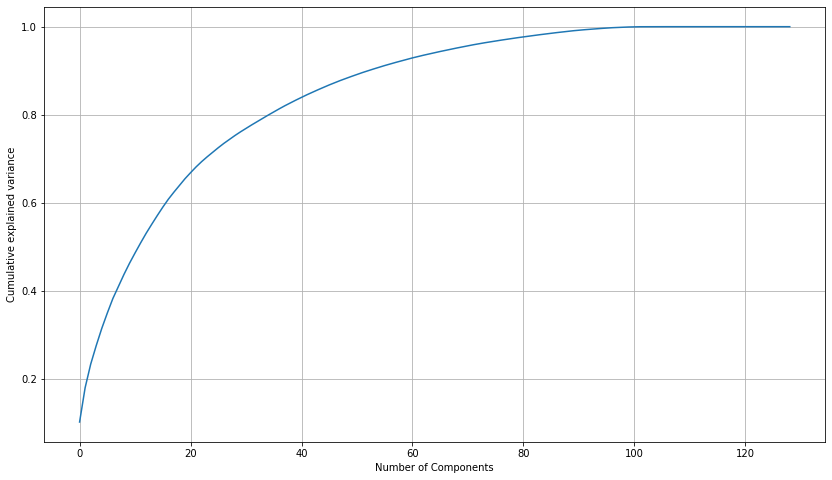

In [71]:
#Making the screeplot - plotting the cumulative variance against the number of components
%matplotlib inline
fig = plt.figure(figsize = (14,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative explained variance')
plt.grid()
plt.show()

## As can be seen from the graph 80 principal components explain more than 90% of the cumulative variance ,hence we will take the top 80 components and proceed with the PCA 

In [72]:
#Finally let's go ahead and do dimenstionality reduction using 80 Principal Components 

from sklearn.decomposition import IncrementalPCA
pca_final = IncrementalPCA(n_components=80)

In [73]:
df_pca = pca_final.fit_transform(X_train)


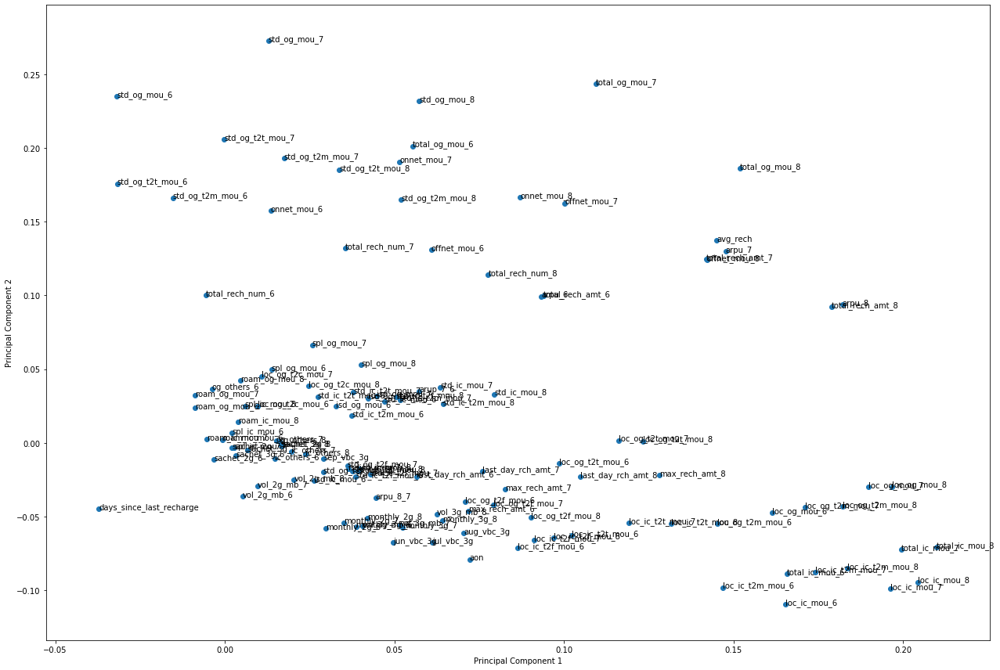

In [74]:
## Plotting PC1 vs PC2 to check the data PC's
%matplotlib inline
fig = plt.figure(figsize = (18,12))
plt.scatter(pcs_df.PC1, pcs_df.PC2)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
for i, txt in enumerate(pcs_df.Feature):
    plt.annotate(txt, (pcs_df.PC1[i],pcs_df.PC2[i]))
plt.tight_layout()
plt.show()

### Plotting PC1 vs PC2 to visualise how the features are loaded

In [75]:
#creating correlation matrix for the principal components
corrmat = np.corrcoef(df_pca.transpose())

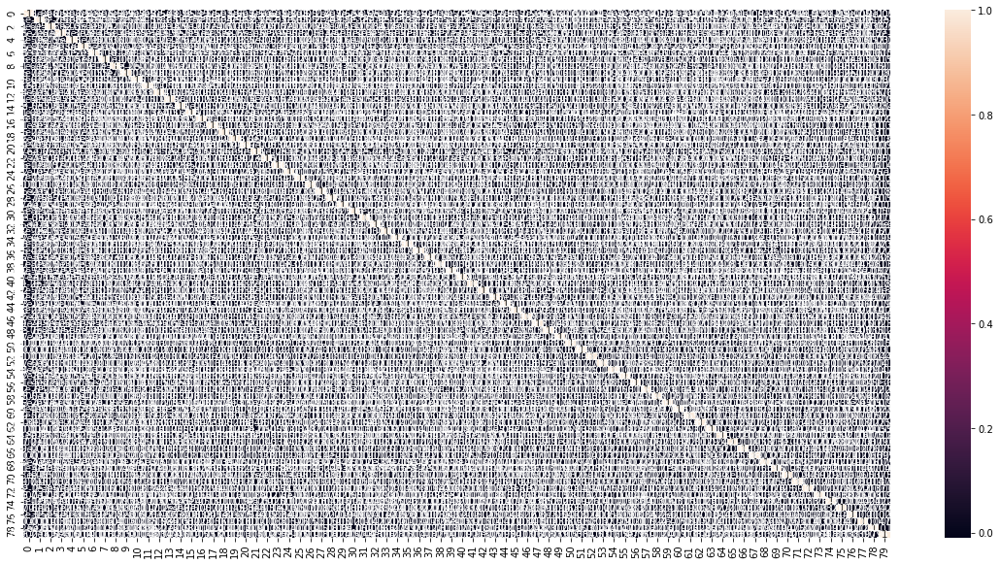

In [76]:
## Plotting heatmap for the correlation matrix
plt.figure(figsize=(20,10))
sns.heatmap(corrmat, annot = True)
plt.show()

In [77]:
df_pca = pd.DataFrame(df_pca)

## Applying Logistic Regression on the PCA Data

In [78]:
logreg = LogisticRegression()

In [79]:
# Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(df_pca)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                38368
Model:                            GLM   Df Residuals:                    38287
Model Family:                Binomial   Df Model:                           80
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14347.
Date:                Mon, 04 Nov 2019   Deviance:                       28694.
Time:                        19:17:44   Pearson chi2:                 2.20e+05
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.4441      0.019    -23.531      0.000      -0.481      -0.407
0             -0.6370      0.009    -71.689      0.000      -0.654      -0.620
1              0.1305      0.006     20.253      0.000       0.118       0.143
2             -0.0054      0.008     -0.633      0.527      -0.022       0.011
3              0.0435      0.011      3.796      0.000       0.021       0.066
4              0.6330      0.009     67.526      0.000       0.615       0.651
5              0.2159      0.010     22.306      0.000       0.197       0.235
6             -0.0871      0.010     -8.805      0.000      -0.106      -0.068
7              0.1149      0.009     12.113      0.000       0.096       0.133
8              0.0303      0.011      2.769      0.006       0.009       0.052
9              0.2425      0.013     19.259      0.000       0.218       0.267
10             0.1117      0.016      6.832      0.000       0.080       0.144
11            -0.4444      0.011    -39.887      0.000      -0.466      -0.423
12             0.0387      0.012      3.156      0.002       0.015       0.063
13             0.0157      0.013      1.183      0.237      -0.010       0.042
14            -0.0764      0.019     -3.958      0.000      -0.114      -0.039
15             0.0133      0.016      0.815      0.415      -0.019       0.045
16            -0.2117      0.020    -10.637      0.000      -0.251      -0.173
17            -0.0450      0.018     -2.467      0.014      -0.081      -0.009
18            -0.0904      0.018     -5.054      0.000      -0.125      -0.055
19             0.1111      0.019      5.787      0.000       0.073       0.149
20             0.0122      0.014      0.869      0.385      -0.015       0.040
21            -0.0862      0.020     -4.298      0.000      -0.125      -0.047
22            -0.0987      0.019     -5.329      0.000      -0.135      -0.062
23             0.1189      0.017      7.152      0.000       0.086       0.152
24            -0.1778      0.021     -8.490      0.000      -0.219      -0.137
25             0.5193      0.022     23.695      0.000       0.476       0.562
26            -0.3192      0.020    -16.369      0.000      -0.357      -0.281
27             0.0487      0.022      2.256      0.024       0.006       0.091
28            -0.0617      0.022     -2.784      0.005      -0.105      -0.018
29            -0.1297      0.020     -6.360      0.000      -0.170      -0.090
30             0.2673      0.018     14.858      0.000       0.232       0.303
31             0.3171      0.024     13.103      0.000       0.270       0.365
32             0.1113      0.027      4.153      0.000       0.059       0.164
33            -0.0648      0.026     -2.455      0.014      -0.117      -0.013
34            -0.1039      0.020     -5.112      0.000      -0.144      -0.064
35

## Feature selection using RFE

In [80]:
rfe = RFE(logreg,50)             # running RFE with 50 variables as output
rfe = rfe.fit(df_pca, y_train)

In [81]:
rfe.support_

array([ True,  True, False, False,  True,  True,  True,  True, False,
        True,  True,  True, False, False, False, False,  True, False,
        True,  True, False,  True,  True,  True,  True,  True,  True,
       False, False,  True,  True,  True,  True, False,  True,  True,
        True, False,  True,  True,  True, False,  True,  True, False,
       False, False, False,  True,  True, False,  True, False, False,
        True,  True,  True, False,  True, False,  True,  True,  True,
        True, False,  True, False, False,  True, False, False,  True,
        True, False,  True,  True,  True,  True, False,  True])

In [82]:
list(zip(df_pca.columns, rfe.support_, rfe.ranking_))

[(0, True, 1),
 (1, True, 1),
 (2, False, 26),
 (3, False, 12),
 (4, True, 1),
 (5, True, 1),
 (6, True, 1),
 (7, True, 1),
 (8, False, 17),
 (9, True, 1),
 (10, True, 1),
 (11, True, 1),
 (12, False, 15),
 (13, False, 21),
 (14, False, 9),
 (15, False, 22),
 (16, True, 1),
 (17, False, 8),
 (18, True, 1),
 (19, True, 1),
 (20, False, 23),
 (21, True, 1),
 (22, True, 1),
 (23, True, 1),
 (24, True, 1),
 (25, True, 1),
 (26, True, 1),
 (27, False, 4),
 (28, False, 2),
 (29, True, 1),
 (30, True, 1),
 (31, True, 1),
 (32, True, 1),
 (33, False, 10),
 (34, True, 1),
 (35, True, 1),
 (36, True, 1),
 (37, False, 18),
 (38, True, 1),
 (39, True, 1),
 (40, True, 1),
 (41, False, 24),
 (42, True, 1),
 (43, True, 1),
 (44, False, 20),
 (45, False, 27),
 (46, False, 14),
 (47, False, 25),
 (48, True, 1),
 (49, True, 1),
 (50, False, 6),
 (51, True, 1),
 (52, False, 5),
 (53, False, 30),
 (54, True, 1),
 (55, True, 1),
 (56, True, 1),
 (57, False, 28),
 (58, True, 1),
 (59, False, 3),
 (60, True,

In [83]:
col = df_pca.columns[rfe.support_]
col

Int64Index([ 0,  1,  4,  5,  6,  7,  9, 10, 11, 16, 18, 19, 21, 22, 23, 24, 25,
            26, 29, 30, 31, 32, 34, 35, 36, 38, 39, 40, 42, 43, 48, 49, 51, 54,
            55, 56, 58, 60, 61, 62, 63, 65, 68, 71, 72, 74, 75, 76, 77, 79],
           dtype='int64')

In [84]:
df_pca.columns[~rfe.support_]

Int64Index([ 2,  3,  8, 12, 13, 14, 15, 17, 20, 27, 28, 33, 37, 41, 44, 45, 46,
            47, 50, 52, 53, 57, 59, 64, 66, 67, 69, 70, 73, 78],
           dtype='int64')

In [85]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = df_pca[col].columns
vif['VIF'] = [variance_inflation_factor(df_pca[col].values, i) for i in range(df_pca[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,0,1.0
37,60,1.0
27,40,1.0
28,42,1.0
29,43,1.0
30,48,1.0
31,49,1.0
32,51,1.0
33,54,1.0
34,55,1.0


In [86]:
X_train_sm1 = sm.add_constant(df_pca[col])
logm2 = sm.GLM(y_train,X_train_sm1, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                38368
Model:                            GLM   Df Residuals:                    38317
Model Family:                Binomial   Df Model:                           50
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14407.
Date:                Mon, 04 Nov 2019   Deviance:                       28813.
Time:                        19:18:32   Pearson chi2:                 1.73e+05
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.4226      0.018    -23.705      0.000      -0.457      -0.388
0             -0.6249      0.008    -76.714      0.000      -0.641      -0.609
1              0.1312      0.006     21.587      0.000       0.119       0.143
4              0.6291      0.009     69.035      0.000       0.611       0.647
5              0.2263      0.009     25.253      0.000       0.209       0.244
6             -0.0828      0.009     -9.180      0.000      -0.101      -0.065
7              0.1106      0.009     12.053      0.000       0.093       0.129
9              0.2292      0.011     20.527      0.000       0.207       0.251
10             0.1252      0.014      8.904      0.000       0.098       0.153
11            -0.4630      0.010    -44.291      0.000      -0.483      -0.443
16            -0.1676      0.014    -11.789      0.000      -0.196      -0.140
18            -0.0993      0.015     -6.752      0.000      -0.128      -0.070
19             0.0768      0.013      5.921      0.000       0.051       0.102
21            -0.1034      0.019     -5.516      0.000      -0.140      -0.067
22            -0.1020      0.018     -5.585      0.000      -0.138      -0.066
23             0.1048      0.016      6.757      0.000       0.074       0.135
24            -0.1914      0.019    -10.314      0.000      -0.228      -0.155
25             0.5131      0.020     25.524      0.000       0.474       0.553
26            -0.3426      0.018    -18.525      0.000      -0.379      -0.306
29            -0.1509      0.018     -8.294      0.000      -0.187      -0.115
30             0.2632      0.018     14.948      0.000       0.229       0.298
31             0.2851      0.021     13.360      0.000       0.243       0.327
32             0.1301      0.021      6.078      0.000       0.088       0.172
34            -0.1039      0.019     -5.350      0.000      -0.142      -0.066
35            -0.2246      0.024     -9.185      0.000      -0.273      -0.177
36            -0.0774      0.021     -3.767      0.000      -0.118      -0.037
38            -0.1223      0.020     -6.122      0.000      -0.161      -0.083
39             0.1809      0.021      8.787      0.000       0.141       0.221
40            -0.3227      0.019    -17.411      0.000      -0.359      -0.286
42            -0.2908      0.022    -13.088      0.000      -0.334      -0.247
43             0.1492      0.021      7.006      0.000       0.107       0.191
48             0.1641      0.023      7.187      0.000       0.119       0.209
49            -0.1331      0.026     -5.147      0.000      -0.184      -0.082
51             0.2680      0.027      9.960      0.000       0.215       0.321
54             0.1881      0.026      7.125      0.000       0.136       0.240
55            -0.1694      0.028     -6.106      0.000      -0.224      -0.115
56

In [87]:
X_train_sm1.shape
X_train_cols = X_train_sm1.columns

In [88]:
y_train.shape

(38368,)

## PCA transforming the test data

In [89]:
X_test_log = pca_final.transform(X_test)
X_test_log = pd.DataFrame(X_test_log)
X_test_log.head()

,0,1,2,3,4,5,6,7,8,9,...,70,71,72,73,74,75,76,77,78,79
0,-2.357701,1.558495,-2.047053,0.643151,3.596504,1.314850,-3.394500,-1.397334,0.138912,-0.129067,...,0.233855,0.131748,-0.121211,-0.121856,0.257152,0.173651,-0.284388,0.154988,0.072098,-0.095783
1,-2.016149,4.132511,-0.334079,1.482757,1.048000,2.493750,2.090463,-0.865914,0.335859,1.401477,...,-0.591196,-0.577165,-0.300296,0.035383,-0.069948,-0.164408,0.049752,0.067863,-0.074659,-0.126198
2,-1.546305,-3.112250,3.393662,-0.338451,-0.569663,0.090409,0.508139,-1.577552,-0.899960,0.725442,...,-0.154338,-0.015571,0.015455,0.045692,-0.036976,0.050613,-0.137071,0.356126,0.296782,-0.082310
3,-0.178937,-1.144364,-1.698772,-0.666512,-0.398667,-0.585818,-1.407852,1.140075,0.646730,0.426940,...,-0.186113,-0.059480,0.234671,0.064555,-0.119147,-0.019088,0.156099,0.032859,-0.090000,-0.322507
4,3.393182,0.810410,-5.017176,-6.030207,-0.598736,4.668079,5.176015,-0.490431,-2.177446,-4.222231,...,0.636548,-0.641390,-0.642320,0.023461,0.070929,-0.099154,0.090556,0.701283,0.006676,0.005442


In [90]:
X_test_log = sm.add_constant(X_test_log)
X_test_log_conv = X_test_log[X_train_cols]
X_test_log_conv.head()

,const,0,1,4,5,6,7,9,10,11,...,63,65,68,71,72,74,75,76,77,79
0,1.0,-2.357701,1.558495,3.596504,1.314850,-3.394500,-1.397334,-0.129067,-0.615779,0.223085,...,-0.448081,0.717461,0.027859,0.131748,-0.121211,0.257152,0.173651,-0.284388,0.154988,-0.095783
1,1.0,-2.016149,4.132511,1.048000,2.493750,2.090463,-0.865914,1.401477,0.422548,-0.425378,...,0.304369,0.980871,-0.356684,-0.577165,-0.300296,-0.069948,-0.164408,0.049752,0.067863,-0.126198
2,1.0,-1.546305,-3.112250,-0.569663,0.090409,0.508139,-1.577552,0.725442,-0.788566,0.356735,...,0.032747,0.118189,0.028180,-0.015571,0.015455,-0.036976,0.050613,-0.137071,0.356126,-0.082310
3,1.0,-0.178937,-1.144364,-0.398667,-0.585818,-1.407852,1.140075,0.426940,-0.502183,-0.385182,...,-0.051820,-0.042912,-0.084361,-0.059480,0.234671,-0.119147,-0.019088,0.156099,0.032859,-0.322507
4,1.0,3.393182,0.810410,-0.598736,4.668079,5.176015,-0.490431,-4.222231,7.255824,-2.180789,...,0.384026,-0.797450,-0.122659,-0.641390,-0.642320,0.070929,-0.099154,0.090556,0.701283,0.005442


In [91]:
y_test_pred = res.predict(X_test_log_conv)

In [92]:
y_test_pred = y_test_pred.values.reshape(-1)
y_test_pred[:10]

array([0.89371286, 0.93359012, 0.25281868, 0.35220844, 0.35078516,
       0.12612057, 0.96448382, 0.2551686 , 0.25865601, 0.9741078 ])

In [93]:
y_test = pd.DataFrame(y_test)
y_test.head()

,churn
29360,0
49979,0
90612,0
87007,0
91852,0


In [94]:
y_test_final = y_test

In [95]:
y_test_pred.shape

(9004,)

In [96]:
mob_test = pd.DataFrame(mob_train)
mob_test = mob_test.rename(columns = {0:'mobile_number'})
mob_test.head()

,mobile_number
0,7.000476e+09
1,7.002362e+09
2,7.002395e+09
3,7.001527e+09
4,7.001867e+09


In [97]:
y_test = y_test.rename(columns={0:'Churn'})
y_test.head()

,churn
29360,0
49979,0
90612,0
87007,0
91852,0


In [98]:
y_test_pred_final = pd.DataFrame({'Churned':y_test.churn, 'Churn_Probab':y_test_pred})
#y_test_pred_final['Mobile_Number'] = mob_test.mobile_number
y_test_pred_final.head(15)

,Churned,Churn_Probab
29360,0,0.893713
49979,0,0.933590
90612,0,0.252819
87007,0,0.352208
91852,0,0.350785
28100,0,0.126121
69301,0,0.964484
50905,0,0.255169
31097,0,0.258656
83157,1,0.974108


In [99]:
y_test_pred_final['predicted'] = y_test_pred_final.Churn_Probab.map(lambda x: 1 if x > 0.75 else 0)

# Let's see the head
y_test_pred_final.head()

,Churned,Churn_Probab,predicted
29360,0,0.893713,1
49979,0,0.933590,1
90612,0,0.252819,0
87007,0,0.352208,0
91852,0,0.350785,0


In [100]:
from sklearn import metrics

In [101]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_test_pred_final.Churned, y_test_pred_final.predicted )
print(confusion)

[[6634 1600]
 [  99  671]]


In [196]:
# Let's check the overall accuracy.
print(100*(metrics.accuracy_score(y_test_pred_final.Churned, y_test_pred_final.predicted)))

81.13060861839183


In [103]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [104]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.8714285714285714

In [105]:
# Let us calculate specificity
TN / float(TN+FP)

0.8056837503036192

In [106]:
# Calculate false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.19431624969638087


In [107]:
# positive predictive value 
print (TP / float(TP+FP))

0.2954645530603259


In [108]:
# ROC Curve

def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [109]:
fpr, tpr, thresholds = metrics.roc_curve( y_test_pred_final.Churned, y_test_pred_final.Churn_Probab, drop_intermediate = False )

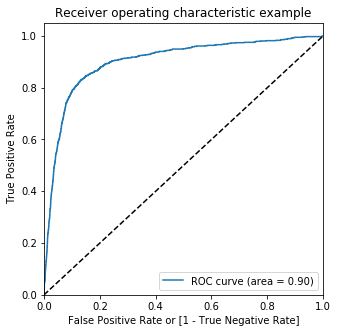

In [110]:
draw_roc(y_test_pred_final.Churned, y_test_pred_final.Churn_Probab)

In [111]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_test_pred_final[i]= y_test_pred_final.Churn_Probab.map(lambda x: 1 if x > i else 0)
y_test_pred_final.head()

,Churned,Churn_Probab,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
29360,0,0.893713,1,1,1,1,1,1,1,1,1,1,0
49979,0,0.933590,1,1,1,1,1,1,1,1,1,1,1
90612,0,0.252819,0,1,1,1,0,0,0,0,0,0,0
87007,0,0.352208,0,1,1,1,1,0,0,0,0,0,0
91852,0,0.350785,0,1,1,1,1,0,0,0,0,0,0


In [112]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_test_pred_final.Churned, y_test_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.085518  1.000000  0.000000
0.1   0.1  0.273989  0.980519  0.207918
0.2   0.2  0.371946  0.972727  0.315764
0.3   0.3  0.451799  0.963636  0.403935
0.4   0.4  0.535873  0.950649  0.497085
0.5   0.5  0.616726  0.940260  0.586471
0.6   0.6  0.695802  0.918182  0.675006
0.7   0.7  0.775211  0.900000  0.763541
0.8   0.8  0.847512  0.846753  0.847583
0.9   0.9  0.906264  0.736364  0.922152


<Figure size 1080x1080 with 0 Axes>

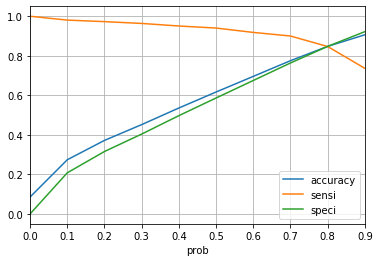

In [113]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
plt.figure(figsize=(15,15))
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.grid()
plt.show()

## Precision and Recall for logistic regression model

In [114]:
# Precision
confusion[1,1]/(confusion[0,1]+confusion[1,1])

0.2954645530603259

In [115]:
# Recall
confusion[1,1]/(confusion[1,0]+confusion[1,1])

0.8714285714285714

## Metrics for Logistic regression
- Accuracy : 81.13%
- AUC_ROC score / area under ROC curve : 0.90
- Recall : 0.8714

## In this case study the primary importance is to predicting churn ,even if we lead to some incorrect predictions .
## Hence we will be choosing `Recall` to be the primary metric to evaluate and choose the best model. 
## Also ROC_AUC score (or area under the ROC curve) is an important metric as it will help us avoid losses for the company by preventing the discounts /offers to be given to customers who were having very less(~0) probability of churning

## Based on the score above, this looks a good model to be used for prediction. However, since this is PCA transformed we will look at some other models to learn important features

## Tree Models

In [116]:
X_train_dt = X_train_dt.drop(['mobile_number'],axis = 1)

In [117]:
# Importing decision tree classifier from sklearn library
from sklearn.tree import DecisionTreeClassifier

# Fitting the decision tree with default hyperparameters, apart from
dt_default = DecisionTreeClassifier(class_weight="balanced")
dt_default.fit(X_train_df, y_train_df)

DecisionTreeClassifier(class_weight='balanced', criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [118]:
# Let's check the evaluation metrics of our default model

# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Making predictions
y_pred_default = dt_default.predict(X_test)

# Printing classification report
print(classification_report(y_test, y_pred_default))

              precision    recall  f1-score   support

           0       0.96      0.77      0.85      8234
           1       0.21      0.66      0.32       770

    accuracy                           0.76      9004
   macro avg       0.58      0.71      0.59      9004
weighted avg       0.90      0.76      0.81      9004



In [119]:
# Printing confusion matrix and accuracy
print(confusion_matrix(y_test,y_pred_default))
print(accuracy_score(y_test,y_pred_default))

[[6315 1919]
 [ 262  508]]
0.757774322523323


In [120]:
# Importing required packages for visualization
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

# Putting features
features = list(X_train_df.columns[0:])
features

['arpu_6',
 'arpu_7',
 'arpu_8',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'std_og_t2f_mou_6',
 'std_og_t2f_mou_7',
 'std_og_t2f_mou_8',
 'std_og_mou_6',
 'std_og_mou_7',
 'std_og_mou_8',
 'isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'spl_og_mou_6',
 'spl_og_mou_7',
 'spl_og_mou_8',
 'og_others_6',
 'og_others_7',
 'og_others_8',
 'total_og_mou_6',
 'total_og_mou_7',
 'total_og_mou_8',
 'loc_ic_t

In [121]:
# plotting tree with max_depth=3
dot_data = StringIO()  
export_graphviz(dt_default, out_file=dot_data,
                feature_names=features, filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.735082 to fit



## Tuning Max-depth

In [122]:
# GridSearchCV to find optimal max_depth
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(2, 20, 4)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100,
                              class_weight="balanced")

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
tree.fit(X_train_df, y_train_df)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=100,
                                              splitter='best'),
             iid='warn', n_jobs=None, param_grid={'max_depth': range(2, 20, 4)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
            

In [123]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.549086,0.104416,0.010604,0.003843,2,{'max_depth': 2},0.758210,0.779153,0.761304,0.756725,0.753095,0.761698,0.009119,5
1,1.675512,0.070955,0.012956,0.000646,6,{'max_depth': 6},0.863874,0.862922,0.869824,0.879314,0.837857,0.862760,0.013749,4
2,2.345748,0.073618,0.012111,0.001569,10,{'max_depth': 10},0.901238,0.890528,0.889100,0.895977,0.882857,0.891941,0.006249,3
3,3.044650,0.178200,0.012944,0.000913,14,{'max_depth': 14},0.911471,0.901713,0.909329,0.905499,0.897143,0.905032,0.005165,2
4,3.452674,0.071754,0.012704,0.001170,18,{'max_depth': 18},0.911947,0.910757,0.909805,0.912640,0.904286,0.909887,0.002965,1


## Tuning Min-samples leaf

In [124]:
# GridSearchCV to find optimal min_samples_leaf
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100,
                              class_weight = "balanced")

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
tree.fit(X_train_df,y_train_df)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=100,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'min_samples_leaf': range(5, 200, 20)},
             pre_dispatch='2*n_jobs', refit=True, return_train_sco

In [125]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,3.461275,0.137870,0.013165,0.000396,5,{'min_samples_leaf': 5},0.896954,0.894574,0.897430,0.892407,0.884048,0.893083,0.004862,1
1,2.604311,0.319526,0.010795,0.001855,25,{'min_samples_leaf': 25},0.865302,0.859591,0.860305,0.864794,0.855238,0.861046,0.003703,2
2,2.466322,0.260833,0.012242,0.000984,45,{'min_samples_leaf': 45},0.831509,0.861733,0.840790,0.858367,0.855238,0.849526,0.011496,3
3,2.402562,0.184612,0.012983,0.001302,65,{'min_samples_leaf': 65},0.833175,0.845788,0.845788,0.849084,0.853810,0.845528,0.006841,4
4,2.334955,0.193677,0.012945,0.000050,85,{'min_samples_leaf': 85},0.821038,0.861495,0.849119,0.837896,0.843571,0.842624,0.013324,5


In [126]:
dt_default = DecisionTreeClassifier(max_depth=10,min_samples_leaf=5,class_weight="balanced")
dt_default.fit(X_train_df, y_train_df)

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=10,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [127]:

# Making predictions
y_pred_default = dt_default.predict(X_test)

# Printing classification report
print(classification_report(y_test, y_pred_default))

              precision    recall  f1-score   support

           0       0.98      0.41      0.58      8234
           1       0.12      0.89      0.22       770

    accuracy                           0.45      9004
   macro avg       0.55      0.65      0.40      9004
weighted avg       0.90      0.45      0.55      9004



In [128]:
# Printing confusion matrix and accuracy
print(confusion_matrix(y_test,y_pred_default))
print(accuracy_score(y_test,y_pred_default))

[[3384 4850]
 [  83  687]]
0.4521323856063972


In [129]:
# GridSearchCV to find optimal min_samples_split
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(2, 20,2)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100,
                              class_weight="balanced")

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
tree.fit(X_train_df, y_train_df)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=100,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'min_samples_split': range(2, 20, 2)},
             pre_dispatch='2*n_jobs', refit=True, return_train_scor

In [130]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,3.635440,0.362069,0.013597,0.000486,2,{'min_samples_split': 2},0.911709,0.908139,0.914327,0.914544,0.905952,0.910934,0.003399,2
1,3.817942,0.092063,0.013000,0.000030,4,{'min_samples_split': 4},0.913851,0.911471,0.914089,0.916687,0.909048,0.913029,0.002586,1
2,3.743622,0.207447,0.012708,0.000440,6,{'min_samples_split': 6},0.911947,0.907663,0.913137,0.911688,0.907143,0.910316,0.002433,3
3,3.780418,0.153140,0.013163,0.000398,8,{'min_samples_split': 8},0.908139,0.907187,0.911233,0.912402,0.901905,0.908173,0.003674,4
4,3.870037,0.162536,0.012948,0.000633,10,{'min_samples_split': 10},0.905997,0.906473,0.907901,0.908831,0.900476,0.905936,0.002910,5


In [131]:
dt_default = DecisionTreeClassifier(max_depth=8,min_samples_leaf=25,min_samples_split=4,class_weight='balanced')
dt_default.fit(X_train_df, y_train_df)

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=8,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=25, min_samples_split=4,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [132]:

# Making predictions
# predict
y_pred_default = dt_default.predict(X_test_df)

# Printing classification report
print(classification_report(y_test, y_pred_default))

              precision    recall  f1-score   support

           0       0.98      0.87      0.92      8234
           1       0.37      0.84      0.51       770

    accuracy                           0.86      9004
   macro avg       0.68      0.85      0.72      9004
weighted avg       0.93      0.86      0.89      9004



In [192]:
# Printing confusion matrix and accuracy
print(confusion_matrix(y_test,y_pred_default))
print(100*(accuracy_score(y_test,y_pred_default)))

[[7128 1106]
 [ 124  646]]
86.33940470901823


In [134]:
roc = metrics.roc_auc_score(y_test,y_pred_default)
roc*100

85.23199656792077

## Decision tree output summary :
- Overall accuracy : 86.33%
- AUC_ROC score / area under ROC curve : 85.23
- Recall for churn : 84%

## Using SelectFromModel to interpret important features

In [135]:
DecisionTreeClassifier(max_depth=8,min_samples_leaf=25,min_samples_split=4,class_weight='balanced')
dt_default.fit(X_train_df, y_train_df)
sel = SelectFromModel(dt_default)

In [136]:
sel.fit(X_train_df,y_train_df)
sel.get_support()

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,  True, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,  True, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False,  True, False, False,
       False, False,  True, False, False, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False,

In [137]:
selected_feat= X_train.columns[(sel.get_support())]
len(selected_feat)

10

## Important features as predicted by the Decision Tree

In [138]:
print(selected_feat)

Index(['roam_og_mou_7', 'roam_og_mou_8', 'loc_og_mou_8', 'loc_ic_mou_8',
       'total_ic_mou_8', 'max_rech_amt_6', 'last_day_rch_amt_8', 'vol_3g_mb_8',
       'days_since_last_recharge', 'arpu_8_7'],
      dtype='object')


# XG Boost

In [139]:
model = XGBClassifier()
model.fit(X_train_dt,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [140]:
X_test_dt1 = X_test_dt.drop(['mobile_number'],axis = 1)
y_pred = model.predict_proba(X_test_dt1)

In [141]:
y_pred[:10]

array([[0.8475082 , 0.15249184],
       [0.30804843, 0.6919516 ],
       [0.9891232 , 0.01087678],
       [0.97879666, 0.02120331],
       [0.96437585, 0.03562415],
       [0.97571844, 0.02428154],
       [0.34411764, 0.65588236],
       [0.89085805, 0.10914198],
       [0.9770263 , 0.02297369],
       [0.14778596, 0.85221404]], dtype=float32)

In [142]:
roc = metrics.roc_auc_score(y_test,y_pred[:,1])
print(roc*100)

93.0088420202581


## Lets try tuning the hyperparameters

In [143]:
folds = 3
param_grid = {'learning_rate':[0.2,0.4,0.6],
             'subsample':[0.3,0.6,0.9]
              }

xgb_model = XGBClassifier()

model_cv = GridSearchCV(estimator=xgb_model,
                       param_grid = param_grid,
                       scoring='roc_auc',
                       cv = folds,
                       verbose=1,
                       return_train_score=True)

In [144]:
model_cv.fit(X_train_dt,y_train)

Fitting 3 folds for each of 9 candidates, totalling 27 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  27 out of  27 | elapsed: 16.9min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0,
                                     learning_rate=0.1, max_delta_step=0,
                                     max_depth=3, min_child_weight=1,
                                     missing=None, n_estimators=100, n_jobs=1,
                                     nthread=None, objective='binary:logistic',
                                     random_state=0, reg_alpha=0, reg_lambda=1,
                                     scale_pos_weight=1, seed=None, silent=None,
                                     subsample=1, verbosity=1),
             iid='warn', n_jobs=None,
             param_grid={'learning_rate': [0.2, 0.4, 0.6],
                         'subsample': [0.3, 0.6, 0.9]},
             pre_dispatch='2*n_jobs', refit=True, re

In [145]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,30.877266,0.260682,0.179506,0.006495,0.2,0.3,"{'learning_rate': 0.2, 'subsample': 0.3}",0.973247,0.996176,0.995275,0.988232,0.010603,6,0.999224,0.991701,0.991917,0.994281,0.003497
1,39.847436,0.312751,0.177364,0.042331,0.2,0.6,"{'learning_rate': 0.2, 'subsample': 0.6}",0.973232,0.996818,0.996344,0.988797,0.011009,3,0.999489,0.992410,0.992620,0.994839,0.003289
2,41.337544,0.705391,0.175477,0.037056,0.2,0.9,"{'learning_rate': 0.2, 'subsample': 0.9}",0.973559,0.996631,0.995789,0.988659,0.010683,4,0.999400,0.992277,0.992391,0.994689,0.003331
3,30.231112,0.720337,0.142540,0.018338,0.4,0.3,"{'learning_rate': 0.4, 'subsample': 0.3}",0.970041,0.996084,0.995491,0.987205,0.012140,8,0.999970,0.994388,0.994534,0.996297,0.002597
4,39.114223,0.314814,0.192214,0.035566,0.4,0.6,"{'learning_rate': 0.4, 'subsample': 0.6}",0.971963,0.997654,0.997409,0.989008,0.012054,2,0.999991,0.995656,0.995995,0.997214,0.001968
5,40.277419,0.557438,0.130858,0.030538,0.4,0.9,"{'learning_rate': 0.4, 'subsample': 0.9}",0.972688,0.998394,0.997744,0.989608,0.011968,1,0.999994,0.996207,0.996117,0.997439,0.001807
6,30.743269,0.253988,0.147587,0.012640,0.6,0.3,"{'learning_rate': 0.6, 'subsample': 0.3}",0.967831,0.993619,0.992824,0.984758,0.011974,9,0.999985,0.994708,0.993819,0.996170,0.002721
7,39.707696,0.501073,0.147586,0.046531,0.6,0.6,"{'learning_rate': 0.6, 'subsample': 0.6}",0.970365,0.996928,0.997112,0.988134,0.012566,7,1.000000,0.997017,0.997333,0.998116,0.001338
8,41.116094,1.421408,0.188418,0.054510,0.6,0.9,"{'learning_rate': 0.6, 'subsample': 0.9}",0.968898,0.997841,0.998322,0.988353,0.013759,5,1.000000,0.997654,0.997867,0.998507,0.001059


In [146]:
cv_results['param_learning_rate'] = cv_results['param_learning_rate'].astype('float')

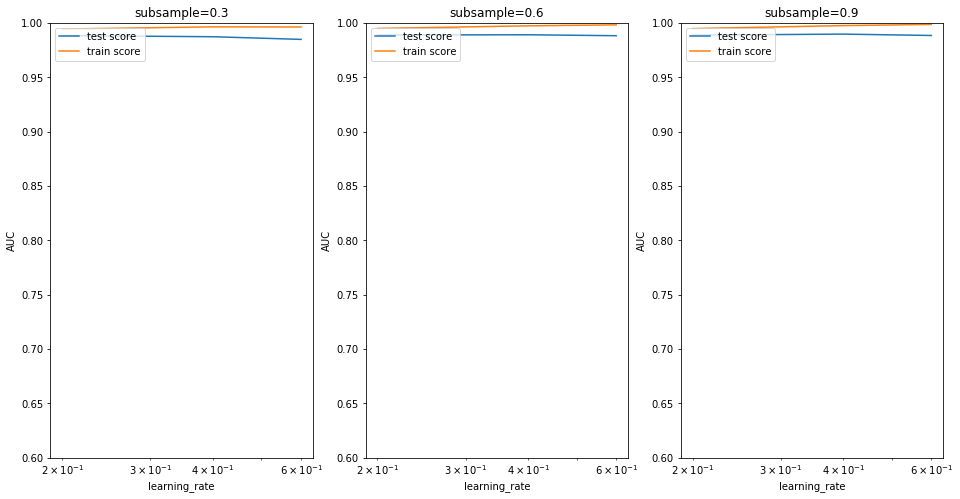

In [147]:
plt.figure(figsize=(16,8))
param_grid = {'learning_rate':[0.2,0.6],
             'subsample':[0.3,0.6,0.9]}

for n,subsample in enumerate(param_grid['subsample']):
    
    plt.subplot(1,len(param_grid['subsample']),n+1)
    df = cv_results[cv_results['param_subsample']==subsample]
    
    plt.plot(df["param_learning_rate"], df["mean_test_score"])
    plt.plot(df["param_learning_rate"], df["mean_train_score"])
    plt.xlabel('learning_rate')
    plt.ylabel('AUC')
    plt.title("subsample={0}".format(subsample))
    plt.ylim([0.60,1])
    plt.legend(['test score', 'train score'], loc = 'upper left')
    plt.xscale('log')

In [148]:
params = {'learning_rate': 0.6,
         'max_depth': 4,
         'n_estimators': 100,
         'subsample': 0.9,
         'objective':'binary:logistic'}

model = XGBClassifier(params = params,base_score=0.52)

model.fit(X_train_dt,y_train)

XGBClassifier(base_score=0.52, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic',
              params={'learning_rate': 0.6, 'max_depth': 4, 'n_estimators': 100,
                      'objective': 'binary:logistic', 'subsample': 0.9},
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=1, verbosity=1)

In [149]:
y_pred = model.predict_proba(X_test_dt1)

In [150]:
y_pred[:10]

array([[0.8667998 , 0.13320021],
       [0.28999215, 0.71000785],
       [0.9907483 , 0.00925173],
       [0.9810301 , 0.01896987],
       [0.96246004, 0.03753996],
       [0.97831726, 0.02168272],
       [0.28199416, 0.71800584],
       [0.90785193, 0.09214804],
       [0.9707305 , 0.02926952],
       [0.19664949, 0.8033505 ]], dtype=float32)

In [151]:
auc = sklearn.metrics.roc_auc_score(y_test,y_pred[:,1])
auc

0.9297166641956539

In [152]:
y_pred_df = pd.DataFrame(y_pred[:,1])
y_pred_df.shape

(9004, 1)

In [153]:
y_test = pd.DataFrame(y_test)
y_test.shape

(9004, 1)

In [154]:
confusion = metrics.confusion_matrix(y_test,y_pred_df.round())
confusion

array([[7677,  557],
       [ 193,  577]], dtype=int64)

In [155]:
# Recall
confusion[1,1]/(confusion[1,0]+confusion[1,1])

0.7493506493506493

In [156]:
importance = dict(zip(X_train_dt.columns, model.feature_importances_))
importance

{'arpu_6': 0.00086565985,
 'arpu_7': 0.0,
 'arpu_8': 0.036100324,
 'onnet_mou_6': 0.00042106642,
 'onnet_mou_7': 0.00038526818,
 'onnet_mou_8': 0.001967545,
 'offnet_mou_6': 0.0013104231,
 'offnet_mou_7': 0.0012545573,
 'offnet_mou_8': 0.001708116,
 'roam_ic_mou_6': 0.0038857558,
 'roam_ic_mou_7': 0.0011609052,
 'roam_ic_mou_8': 0.03657197,
 'roam_og_mou_6': 0.005103543,
 'roam_og_mou_7': 0.013452863,
 'roam_og_mou_8': 0.06390285,
 'loc_og_t2t_mou_6': 0.00070645136,
 'loc_og_t2t_mou_7': 0.0,
 'loc_og_t2t_mou_8': 0.006740169,
 'loc_og_t2m_mou_6': 0.0,
 'loc_og_t2m_mou_7': 0.0006003405,
 'loc_og_t2m_mou_8': 0.0013575961,
 'loc_og_t2f_mou_6': 0.00708372,
 'loc_og_t2f_mou_7': 0.0036052924,
 'loc_og_t2f_mou_8': 0.0025199186,
 'loc_og_t2c_mou_6': 0.0022486988,
 'loc_og_t2c_mou_7': 0.0027896364,
 'loc_og_t2c_mou_8': 0.0,
 'loc_og_mou_6': 0.0,
 'loc_og_mou_7': 0.00057621655,
 'loc_og_mou_8': 0.0087079955,
 'std_og_t2t_mou_6': 0.008325619,
 'std_og_t2t_mou_7': 0.002616803,
 'std_og_t2t_mou_8': 

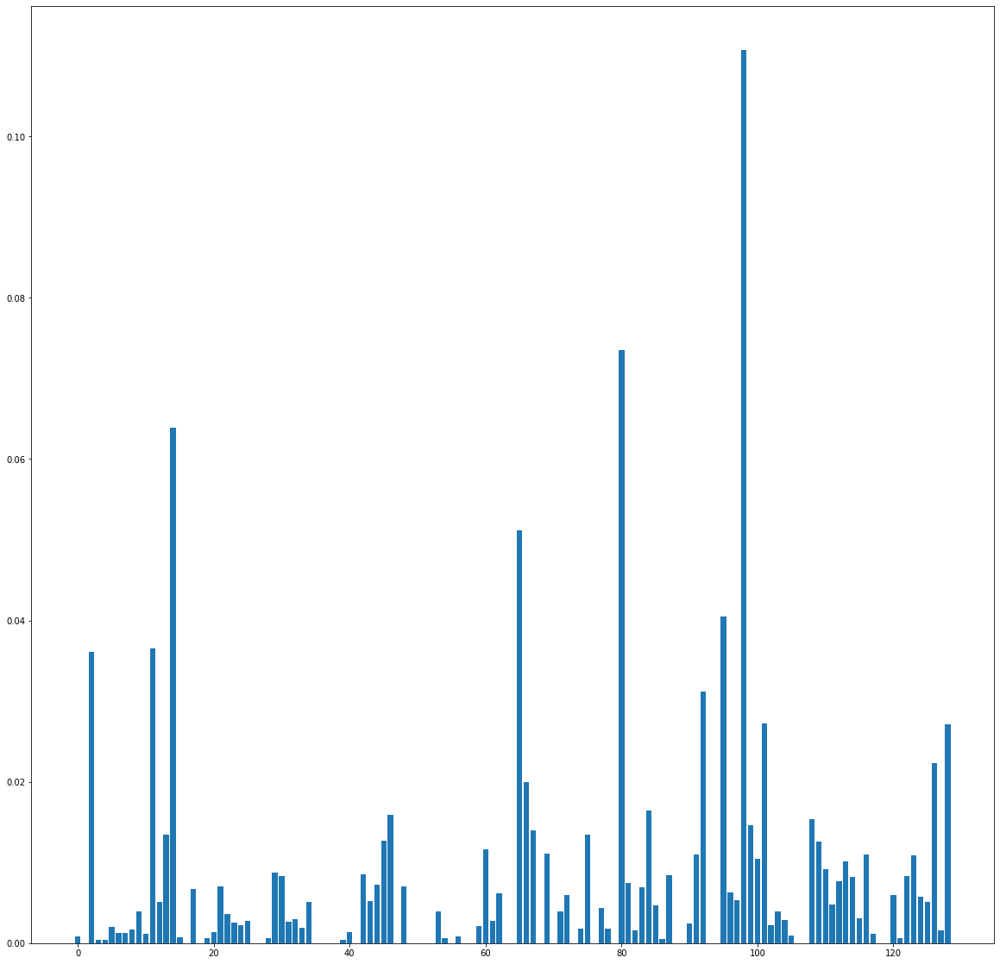

In [157]:
plt.figure(figsize = (20,20))
plt.bar(range(len(model.feature_importances_)),model.feature_importances_)
plt.show()

## XGBoost overall metrics :
- Accuracy : 91.46%
- ROC_AUC score : 0.93
- Recall : 74.93

## Random Forest Classifier

In [158]:
rfc = RandomForestClassifier(class_weight="balanced")

In [159]:
rfc.fit(X_train_df,y_train_df)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=10, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

In [160]:
# Making predictions
predictions = rfc.predict(X_test)

In [161]:
# Let's check the report of our default model
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.97      0.71      0.82      8234
           1       0.21      0.80      0.33       770

    accuracy                           0.72      9004
   macro avg       0.59      0.75      0.57      9004
weighted avg       0.91      0.72      0.78      9004



In [162]:
# Printing confusion matrix
print(confusion_matrix(y_test,predictions))

[[5864 2370]
 [ 157  613]]


In [163]:
print(accuracy_score(y_test,predictions))

0.7193469569080408


# Tuning Max depth

In [164]:
# GridSearchCV to find optimal max_depth
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(2, 40, 5)}

# instantiate the model
rf = RandomForestClassifier(class_weight="balanced")


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
rf.fit(X_train_df, y_train_df)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [165]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head(15)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.409290,0.033601,0.018349,0.000461,2,{'max_depth': 2},0.899572,0.893622,0.899334,0.884789,0.879048,0.891274,0.008134,8
1,1.154202,0.019242,0.022295,0.000341,7,{'max_depth': 7},0.920752,0.921942,0.921228,0.912878,0.915238,0.918408,0.003649,7
2,1.664342,0.038120,0.025371,0.000460,12,{'max_depth': 12},0.933365,0.934317,0.938601,0.937158,0.937619,0.936212,0.002014,5
3,1.772483,0.098869,0.023690,0.005912,17,{'max_depth': 17},0.940029,0.935031,0.942170,0.938586,0.937619,0.938687,0.002386,1
4,1.892342,0.028836,0.026537,0.000452,22,{'max_depth': 22},0.938601,0.935745,0.939791,0.938586,0.938095,0.938163,0.001332,2
5,1.856753,0.059430,0.026731,0.000426,27,{'max_depth': 27},0.936697,0.934317,0.938839,0.940252,0.937143,0.937449,0.002013,3
6,1.862417,0.049819,0.026876,0.000099,32,{'max_depth': 32},0.938125,0.936935,0.937649,0.936206,0.936667,0.937116,0.000688,4
7,1.904887,0.036396,0.027737,0.000391,37,{'max_depth': 37},0.935983,0.931937,0.935269,0.934301,0.938095,0.935117,0.002021,6


# Tuning n-estimators

In [166]:
# GridSearchCV to find optimal n_estimators
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': range(100, 500, 200)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(max_depth=8,class_weight="balanced")


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
rf.fit(X_train_df, y_train_df)



GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=8,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                

In [167]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,10.774151,0.465629,0.108829,0.008155,100,{'n_estimators': 100},0.929557,0.930033,0.930747,0.927160,0.931190,0.929738,0.001407,2
1,33.731447,2.089870,0.304599,0.006488,300,{'n_estimators': 300},0.931223,0.927178,0.932413,0.930255,0.928333,0.929881,0.001900,1


# Tuning max-features

In [168]:
# GridSearchCV to find optimal max_features
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_features': [4, 8, 14, 20, 24, 28, 30, 40]}

# instantiate the model
rf = RandomForestClassifier(max_depth=8,class_weight="balanced")


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
rf.fit(X_train_df, y_train_df)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=8,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                

In [169]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.546968,0.011844,0.023518,0.000774,4,{'max_features': 4},0.922180,0.912423,0.920752,0.918115,0.920476,0.918789,0.003441,8
1,0.948057,0.008363,0.022474,0.001844,8,{'max_features': 8},0.919324,0.923132,0.925036,0.924780,0.919762,0.922407,0.002432,7
2,1.587388,0.013588,0.022346,0.001282,14,{'max_features': 14},0.920276,0.918134,0.926226,0.922637,0.925952,0.922645,0.003153,6
3,2.179344,0.038322,0.021955,0.001058,20,{'max_features': 20},0.924322,0.919086,0.927653,0.924780,0.924048,0.923978,0.002764,5
4,2.587486,0.014083,0.022333,0.000457,24,{'max_features': 24},0.924322,0.924084,0.928129,0.926446,0.924048,0.925406,0.001629,3


# Tuning Min samples leaf

In [170]:
# GridSearchCV to find optimal min_samples_leaf
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(100, 400, 50)}

# instantiate the model
rf = RandomForestClassifier(max_depth=8,class_weight="balanced")


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
rf.fit(X_train_df, y_train_df)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=8,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                

In [171]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.967214,0.180110,0.019148,0.004643,100,{'min_samples_leaf': 100},0.886483,0.886483,0.896478,0.894549,0.883810,0.889561,0.004995,1
1,0.585951,0.194577,0.013457,0.005002,150,{'min_samples_leaf': 150},0.889576,0.883389,0.888862,0.880743,0.873571,0.883229,0.005856,2
2,0.813376,0.044486,0.017757,0.002965,200,{'min_samples_leaf': 200},0.887673,0.885531,0.883151,0.878124,0.876190,0.882135,0.004351,3
3,0.737001,0.041942,0.017834,0.004249,250,{'min_samples_leaf': 250},0.875297,0.884341,0.891004,0.871697,0.873095,0.879088,0.007410,4
4,0.772935,0.032428,0.016785,0.002182,300,{'min_samples_leaf': 300},0.877201,0.872680,0.882199,0.874078,0.874524,0.876137,0.003367,5


# Tuning Min samples split

In [172]:
# GridSearchCV to find optimal min_samples_split
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(200, 500, 50)}

# instantiate the model
rf = RandomForestClassifier(max_depth=8,class_weight="balanced")


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
rf.fit(X_train_df, y_train_df)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=8,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                

In [173]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.963303,0.062543,0.020750,0.002055,200,{'min_samples_split': 200},0.898144,0.903141,0.896240,0.901690,0.893571,0.898558,0.003499,1
1,1.091292,0.063279,0.019983,0.002587,250,{'min_samples_split': 250},0.890766,0.898382,0.901238,0.890740,0.894048,0.895035,0.004179,2
2,0.994558,0.073295,0.017723,0.002458,300,{'min_samples_split': 300},0.895526,0.891004,0.901951,0.888598,0.892381,0.893893,0.004610,3
3,0.986484,0.105157,0.018163,0.003233,350,{'min_samples_split': 350},0.886483,0.882199,0.891718,0.890740,0.880000,0.886228,0.004595,5
4,0.936557,0.057820,0.019605,0.001865,400,{'min_samples_split': 400},0.880057,0.874108,0.891480,0.884551,0.880714,0.882182,0.005726,6


# Grid search

In [174]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [4,8,10],
    'min_samples_leaf': range(100, 400, 200),
    'min_samples_split': range(200, 500, 200),
    'n_estimators': [100,200, 300], 
    'max_features': [5, 10]
}
# Create a based model
rf = RandomForestClassifier(class_weight="balanced")
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1,verbose = 1)

In [175]:
# Fit the grid search to the data
grid_search.fit(X_train_df, y_train_df)

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed:  5.9min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                             

In [176]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)


We can get accuracy of 0.899842909506355 using {'max_depth': 4, 'max_features': 5, 'min_samples_leaf': 100, 'min_samples_split': 200, 'n_estimators': 200}


In [177]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=4,
                             min_samples_leaf=100, 
                             min_samples_split=200,
                             max_features=10,
                             n_estimators=100,
                            class_weight="balanced")

In [178]:
# fit
rfc.fit(X_train_df,y_train_df)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='gini', max_depth=4, max_features=10,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=100,
                       min_samples_split=200, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

In [179]:
# predict
#X_test_df = X_test_df.drop(['mobile_number'],axis = 1)
predictions1 = rfc.predict(X_test_df)

In [180]:
# evaluation metrics
from sklearn.metrics import classification_report,confusion_matrix

In [181]:
print(classification_report(y_test_df,predictions1))

              precision    recall  f1-score   support

           0       0.98      0.92      0.95      8234
           1       0.46      0.76      0.57       770

    accuracy                           0.90      9004
   macro avg       0.72      0.84      0.76      9004
weighted avg       0.93      0.90      0.91      9004



In [182]:
print(confusion_matrix(y_test_df,predictions1))

[[7543  691]
 [ 182  588]]


In [195]:
# Accuracy of the model 
print(100*(accuracy_score(y_test_df,predictions1)))

90.30430919591292


In [184]:
roc = metrics.roc_auc_score(y_test_df,predictions1)
roc*100

83.98580166493696

## Random Forest metrics :
- Accuracy : 90.30%
- Roc_Auc score : 83.98
- Recall : 0.76

In [185]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=4,
                             min_samples_leaf=100, 
                             min_samples_split=200,
                             max_features=10,
                             n_estimators=100,
                            class_weight="balanced")



In [186]:

sel = SelectFromModel(rfc)

In [187]:
sel.fit(X_train_df,y_train_df)

SelectFromModel(estimator=RandomForestClassifier(bootstrap=True,
                                                 class_weight='balanced',
                                                 criterion='gini', max_depth=4,
                                                 max_features=10,
                                                 max_leaf_nodes=None,
                                                 min_impurity_decrease=0.0,
                                                 min_impurity_split=None,
                                                 min_samples_leaf=100,
                                                 min_samples_split=200,
                                                 min_weight_fraction_leaf=0.0,
                                                 n_estimators=100, n_jobs=None,
                                                 oob_score=False,
                                                 random_state=None, verbose=0,
                                                

In [188]:
sel.get_support()

array([False, False,  True, False, False, False, False, False,  True,
       False, False,  True, False, False,  True, False, False,  True,
       False, False,  True, False, False,  True, False, False, False,
       False, False,  True, False, False, False, False, False,  True,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False,  True, False, False,  True, False, False,  True,
       False,  True,  True, False, False, False, False, False,  True,
       False, False, False, False, False,  True, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False,  True, False, False,  True,
       False, False,  True, False, False, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False,

In [189]:
selected_feat= X_train.columns[(sel.get_support())]
len(selected_feat)

25

## Important features as predicted by Random Forest

In [190]:
print(selected_feat)

Index(['arpu_8', 'offnet_mou_8', 'roam_ic_mou_8', 'roam_og_mou_8',
       'loc_og_t2t_mou_8', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_8',
       'loc_og_mou_8', 'std_og_t2m_mou_8', 'std_og_mou_8', 'total_og_mou_8',
       'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_8',
       'loc_ic_mou_7', 'loc_ic_mou_8', 'std_ic_t2m_mou_8', 'std_ic_mou_8',
       'total_ic_mou_8', 'total_rech_amt_8', 'max_rech_amt_8',
       'last_day_rch_amt_8', 'vol_3g_mb_8', 'days_since_last_recharge',
       'arpu_8_7'],
      dtype='object')


# Recommendations :

Based on the important features extracted from both the models, we can conclude/recommend the below -

1. The metrics derived in the EDA step are eventually found to be important for the model.

2. Most of the important features derived are from the action phase as expected.

3. Important indicators of churn to look out for are the monetary features such as the fall in average Revenue, last recharge amount etc. Hence if such a behavior is noticed, offers can be rolled out to these customers.

4. Another important aspect to keep track of is the internet usage. Customers can be offered extra data with a particular recharge to prevent them from chruning.

5. Also another important observation is the number of days since last significant activity such as recharge. If this exceeds a particular limit then the customer can be given offers if he/she makes a recharge on that day.

6. For customer generating very high revenues. they can be contacted personally by an agent to offer them tailor-made deal based on their data/call usage.